In [ ]:
#Importando as bibliotecas
!pip install seaborn matplotlib scikit-learn
!pip install pickle5
!pip install keras
!pip install xgboost
import pandas as pd  #Para manipulação de dados em Python que facilita o trabalho com grandes conjuntos de dados estruturados.
import numpy as np  #Para computação numérica em Python que fornece suporte para arrays multidimensionais e várias funções matemáticas de alto desempenho.
import matplotlib.pyplot as plt   #Permite criar gráficos em 2D, como gráficos de linha, dispersão, barras e histogramas.
import seaborn as sns #Construída sobre o matplotlib, que facilita a criação de gráficos estatísticos mais sofisticados e visualmente agradáveis.
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
from keras.models import Sequential
from keras.layers import Dense
import joblib
import keras
from pickle5 import pickle

In [ ]:
#Carregando a planilha de dados, pré-carregada no campo de arquivos do collab
Nasa_Training = pd.read_csv("/content/Dataset_Nasa_Training.csv")

In [ ]:
dados = pd.DataFrame(Nasa_Training)

In [ ]:
#Verificando o número de colunas e linhas
dados.shape

(90836, 10)

In [ ]:
#Exibindo uma info geral do arquivo
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90836 entries, 0 to 90835
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  90836 non-null  int64  
 1   name                90836 non-null  object 
 2   est_diameter_min    90836 non-null  float64
 3   est_diameter_max    90836 non-null  float64
 4   relative_velocity   90836 non-null  float64
 5   miss_distance       90836 non-null  float64
 6   orbiting_body       90836 non-null  object 
 7   sentry_object       90836 non-null  bool   
 8   absolute_magnitude  90836 non-null  float64
 9   hazardous           90836 non-null  bool   
dtypes: bool(2), float64(5), int64(1), object(2)
memory usage: 5.7+ MB


In [ ]:
#verificação rápida da estrutura geral da tabela de dados
dados.head(17000)

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,1.198271,2.679415,13569.249224,5.483974e+07,16.73,False
1,0.265800,0.594347,73588.726663,6.143813e+07,20.00,True
2,0.722030,1.614507,114258.692129,4.979872e+07,17.83,False
3,0.096506,0.215794,24764.303138,2.543497e+07,22.20,False
4,0.255009,0.570217,42737.733765,4.627557e+07,20.09,True
...,...,...,...,...,...,...
16995,0.084053,0.187949,94448.564096,3.025436e+07,22.50,False
16996,0.278327,0.622358,72659.262777,5.106259e+07,19.90,False
16997,0.011080,0.024777,14266.296734,2.128504e+07,26.90,False
16998,0.305179,0.682402,35468.859293,6.455463e+07,19.70,True


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
#Verificando a quantidade de valores variáveis na coluna "sentry_object"
dados['sentry_object'].value_counts()

,count
sentry_object,
False,90836


In [ ]:
#Excluindo a coluna "sentry_object"
dados = dados.drop('sentry_object', axis=1)

In [ ]:
#Verificando a quantidade de valores variáveis na coluna "orbiting_body"
dados['orbiting_body'].value_counts()

,count
orbiting_body,
Earth,90836


In [ ]:
#Excluindo a coluna "sentry_object"
dados = dados.drop('orbiting_body', axis=1)

In [ ]:
#Excluindo as coluna "Name"
dados = dados.drop('name', axis=1)

In [ ]:
#Excluindo as coluna "id"
dados = dados.drop('id', axis=1)

In [ ]:
#verificando novamente a base dados após as exclusões
dados.head()

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,1.198271,2.679415,13569.249224,5.483974e+07,16.73,False
1,0.265800,0.594347,73588.726663,6.143813e+07,20.00,True
2,0.722030,1.614507,114258.692129,4.979872e+07,17.83,False
3,0.096506,0.215794,24764.303138,2.543497e+07,22.20,False
4,0.255009,0.570217,42737.733765,4.627557e+07,20.09,True


In [ ]:
#Verificando se existem dados nulos
print(dados.isnull().sum())

est_diameter_min      0
est_diameter_max      0
relative_velocity     0
miss_distance         0
absolute_magnitude    0
hazardous             0
dtype: int64


In [ ]:
#A coluna hazardous, será a classe e será verificada se está balanceada
dados['hazardous'].value_counts()

,count
hazardous,
False,81996
True,8840


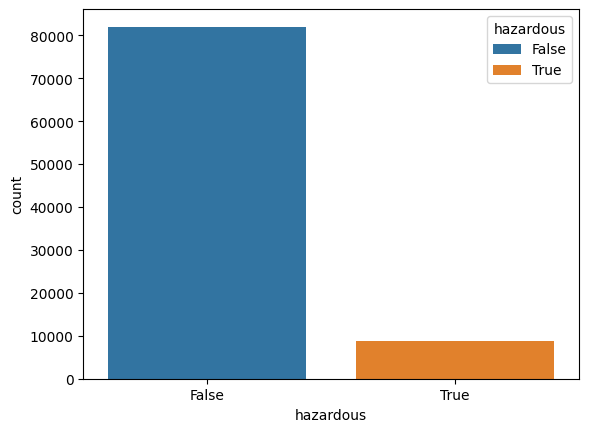

In [ ]:
#Gráfico de Barras da classe ('hazardous') - da base original desbalanceada

for col in dados.columns:
    if dados[col].dtype == 'int':
        dados[col] = dados[col].astype(bool)

dados = dados.reset_index(drop=True)
sns.countplot(x='hazardous', data=dados, hue='hazardous')
plt.show()

In [ ]:
# Separando as duas classes
dados_false = dados[dados['hazardous'] == False]  # Classe majoritária (False)
dados_true = dados[dados['hazardous'] == True]    # Classe minoritária (True)

# Realizando o undersampling da classe majoritária
dados_false_under = dados_false.sample(n=len(dados_true), random_state=42)  # Subamostra para igualar os True (9000)

#Concatenando a classe minoritária com a subamostra da majoritária
dados_balancedos = pd.concat([dados_false_under, dados_true])

In [ ]:
#verificando se a base está de fato balanceado conforme a classe
dados_balancedos['hazardous'].value_counts()

,count
hazardous,
False,8840
True,8840


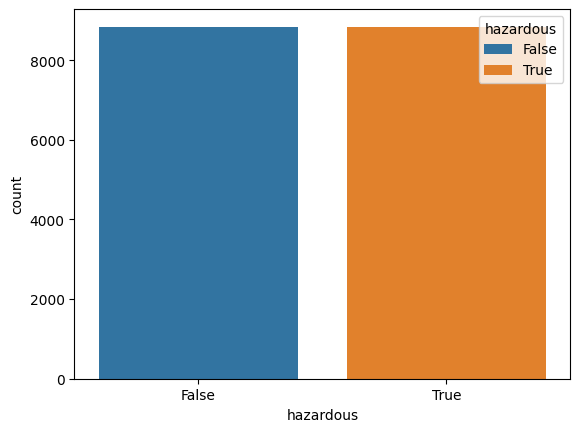

In [ ]:
#Gráfico de Barras da classe ('hazardous') - da base original desbalanceada

for col in dados_balancedos.columns:
    if dados_balancedos[col].dtype == 'int':
        dados_balancedos[col] = dados[col].astype(bool)

dados_balancedos = dados_balancedos.reset_index(drop=True)
sns.countplot(x='hazardous', data=dados_balancedos, hue='hazardous')
plt.show()

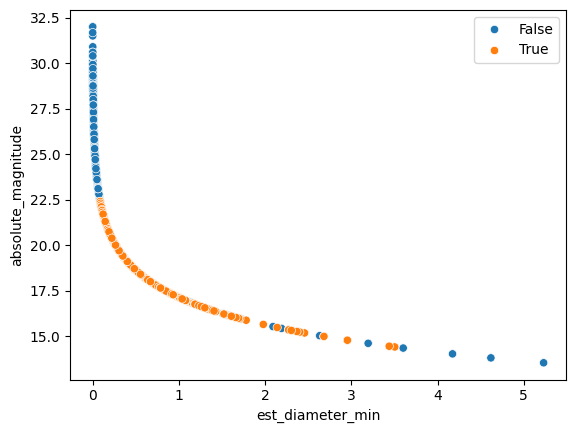

In [ ]:
#Scatterplot de corpos com diametro mínimo pela magnitude, com base na periculosidade (harzardous)

#Transformando de volta a classe, que está do tipo inteiro para booleana
for col in dados_balancedos.columns:
    if dados_balancedos[col].dtype == 'int':
        dados_balancedos[col] = dados_balancedos[col].astype(bool)

#Estabelecendo as colunas para a geração gráfica
sns.scatterplot(x=dados_balancedos['est_diameter_min'], y=dados_balancedos['absolute_magnitude'], hue='hazardous',
                data=dados_balancedos)

#Posicionando a legenda na figura
plt.legend(bbox_to_anchor=(1, 1), loc=1)

plt.show()

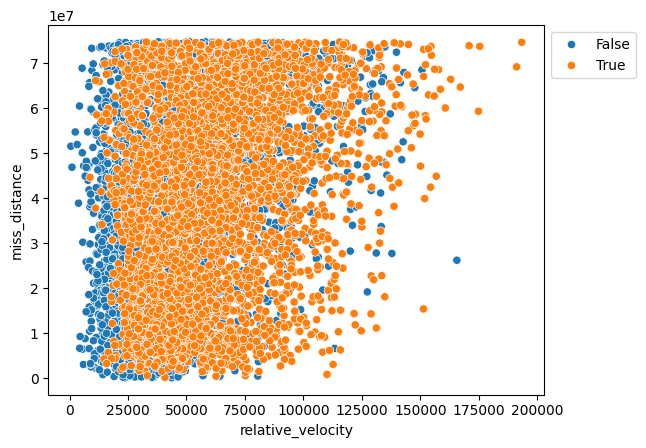

In [ ]:
#Scatterplot de corpos velocidade relativa pela distancia, com base na periculosidade (harzardous)
sns.scatterplot(x = dados_balancedos['relative_velocity'], y = dados_balancedos['miss_distance'],
                hue ='hazardous', data = dados_balancedos)
# Posicionando a legenda na figura
plt.legend(bbox_to_anchor = (1, 1), loc=2)

plt.show()

In [ ]:
correlacao = dados_balancedos.corr(method='pearson')
correlacao

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
est_diameter_min,1.000000,1.000000,0.251298,0.065808,-0.692058,0.287188
est_diameter_max,1.000000,1.000000,0.251298,0.065808,-0.692058,0.287188
relative_velocity,0.251298,0.251298,1.000000,0.281277,-0.339749,0.258899
miss_distance,0.065808,0.065808,0.281277,1.000000,-0.083924,-0.032624
absolute_magnitude,-0.692058,-0.692058,-0.339749,-0.083924,1.000000,-0.581817
hazardous,0.287188,0.287188,0.258899,-0.032624,-0.581817,1.000000


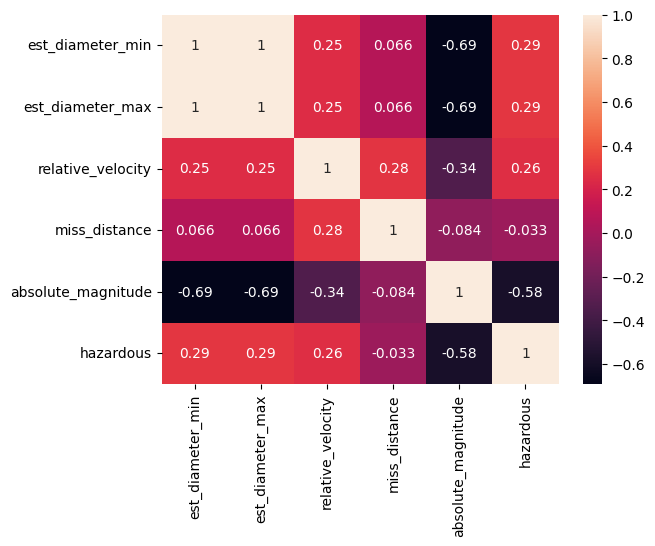

In [ ]:
sns.heatmap(correlacao, annot = True);
plt.show()

In [ ]:
#verificando a base balanceada
dados_balancedos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17680 entries, 86926 to 90818
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   est_diameter_min    17680 non-null  float64
 1   est_diameter_max    17680 non-null  float64
 2   relative_velocity   17680 non-null  float64
 3   miss_distance       17680 non-null  float64
 4   absolute_magnitude  17680 non-null  float64
 5   hazardous           17680 non-null  bool   
dtypes: bool(1), float64(5)
memory usage: 846.0 KB


In [ ]:
#fazendo uma verificação estrutural da base balanceada
dados_balancedos.head(10)

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
86926,0.058151,0.130029,59771.348243,5.816824e+07,23.30,False
765,0.139494,0.311918,26859.447868,2.253203e+07,21.40,False
27949,0.011603,0.025944,23069.312035,7.145669e+07,26.80,False
83885,0.033928,0.075865,24228.020498,5.486865e+07,24.47,False
66888,0.384198,0.859093,108889.003863,5.435923e+07,19.20,False
5040,0.036691,0.082043,43035.878077,1.536541e+07,24.30,False
34206,0.073885,0.165211,73456.309495,4.279051e+07,22.78,False
509,0.231502,0.517654,66866.952901,6.851952e+07,20.30,False
32779,0.101054,0.225964,56423.608663,3.366767e+07,22.10,False
53068,0.461907,1.032856,86688.111589,5.110205e+07,18.80,False


In [ ]:
X = dados_balancedos.drop(columns=['hazardous']) # Select all columns except 'target' for features
y = dados_balancedos['hazardous'] # Select the 'target' column

# Now you can create your DataFrame
dados_tratados = pd.DataFrame(X, columns=X.columns) # Use X.columns to get feature names
dados_tratados['hazardous'] = y
dados_tratados.sample(10)

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
46085,0.110804,0.247765,71275.406632,6.357014e+07,21.90,True
46260,0.024241,0.054205,25073.710357,5.855585e+06,25.20,False
3720,0.006145,0.013742,37327.852442,4.700053e+07,28.18,False
82267,0.300992,0.673039,135428.056236,7.353922e+07,19.73,True
47372,0.038420,0.085909,37937.820443,1.886176e+07,24.20,False
68745,0.265800,0.594347,47869.645404,2.524504e+07,20.00,True
28599,0.016771,0.037501,38899.422281,7.276403e+06,26.00,False
67831,0.415485,0.929052,84777.069643,7.063635e+07,19.03,False
4305,0.109284,0.244366,52847.673413,5.333369e+07,21.93,True
13297,0.157237,0.351593,31375.955189,4.680738e+07,21.14,True


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
#PRIMEIRO CENÁRIO: TREINAMENTO DAS IAs EM 70/30 de uma base balanceada.
#treinando nosso primeiro modelo: Rede Neural - MLPClassifier com 2 camadas
mlp = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=200, batch_size = 10)
mlp.fit(X_train, y_train)

MLPClassifier(batch_size=10, hidden_layer_sizes=(100, 100))

In [ ]:
classifiers1 = [mlp]
classifier_names1 = ["Rede Neural"]

Resultados para Rede Neural:
              precision    recall  f1-score   support

       False       0.96      0.78      0.86      2575
        True       0.83      0.97      0.89      2729

    accuracy                           0.88      5304
   macro avg       0.89      0.88      0.88      5304
weighted avg       0.89      0.88      0.88      5304



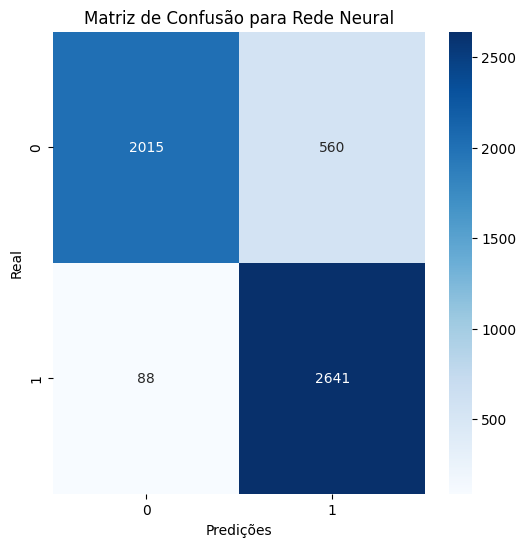

In [ ]:
for clf, clf_name in zip(classifiers1, classifier_names1):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(mlp, 'modelo_rede_neural.pkl')

['modelo_rede_neural.pkl']

In [ ]:
#treinando nosso primeiro modelo: Rede Neural - MLPClassifier com 3 camadas
mlp = MLPClassifier(hidden_layer_sizes=(100, 100, 100), max_iter=200, batch_size = 10)
mlp.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(batch_size=10, hidden_layer_sizes=(100, 100, 100))

In [ ]:
classifiers2 = [mlp]
classifier_names2 = ["Rede Neural"]

Resultados para Rede Neural:
              precision    recall  f1-score   support

       False       0.97      0.77      0.86      2575
        True       0.82      0.98      0.89      2729

    accuracy                           0.88      5304
   macro avg       0.89      0.87      0.88      5304
weighted avg       0.89      0.88      0.88      5304



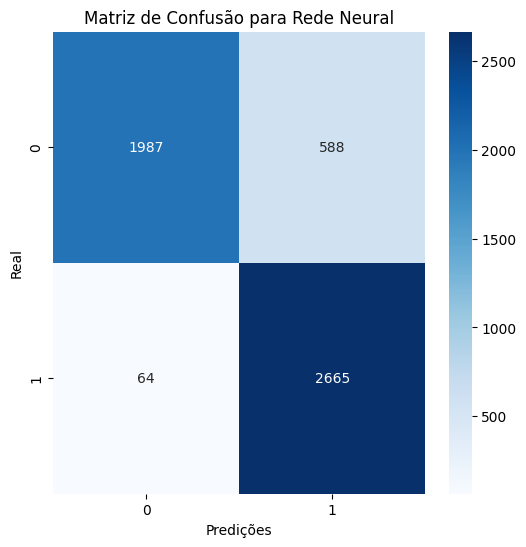

In [ ]:
for clf, clf_name in zip(classifiers2, classifier_names2):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
#Testando uma amostra aleatória
new_sample = np.array([[0.0738847787,0.8204270649, 0.2060819612,
                        0.1010543415,51576.141700413,37937.820443]])
#new_sample = scaler.transform(new_sample)
for clf, clf_name in zip(classifiers2, classifier_names2):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Rede Neural: Classe False, Certeza: 100.00%


In [ ]:
#Testando a IA, pedindo para ela gerar uma amostra qualquer
new_sample_a = X_test[0]
print(new_sample_a)
print(y_test.iloc[0])

[-0.46736671  0.22857998  0.22857998 -0.17599221  0.99638901 -0.74773827]
True


In [ ]:
#treinando nosso segundo modelo: Árvore de Decisão - DecisionTreeClassifier
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
classifiers = [tree]
classifier_names = ["Árvore de Decisão"]

Resultados para Árvore de Decisão:
              precision    recall  f1-score   support

       False       0.85      0.85      0.85      2575
        True       0.86      0.85      0.86      2729

    accuracy                           0.85      5304
   macro avg       0.85      0.85      0.85      5304
weighted avg       0.85      0.85      0.85      5304



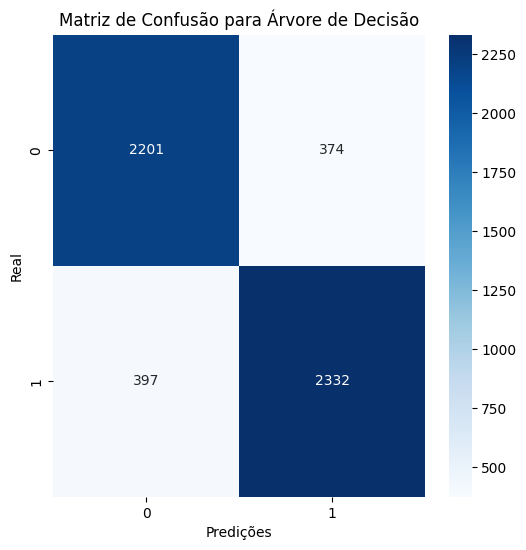

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap= "Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(tree, 'modelo_tree.pkl')

['modelo_tree.pkl']

In [ ]:
new_sample = np.array([[0.0259441818,  0.0738847787,  0.8204270649, 0.0149293183,  0.0802703167,  0.2060819612]])


#new_sample = scaler.transform(new_sample)


for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Árvore de Decisão: Classe False, Certeza: 100.00%


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8546380090497737


In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus

feature_cols = ['id', 'est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude']

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Árvore de Decisão.png')
Image(graph.create_png())

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8748114630467572


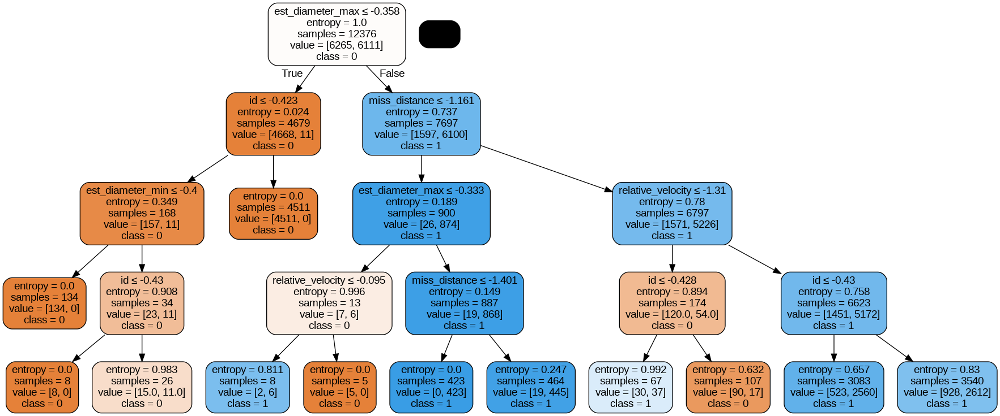

In [ ]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())

In [ ]:
#Treinando nosso terceiro modelo de IA: Keras
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

encoder = OneHotEncoder(sparse_output=False)
# Converta y_train para um array NumPy antes de remodelar
y_train_encoded = encoder.fit_transform(y_train.values.reshape(-1, 1))
y_test_encoded = encoder.transform(y_test.values.reshape(-1, 1))

keras_hidden_layer_sizes = (6, 6)
keras_epochs = 50
keras_batch_size = 1

keras_model = Sequential()
keras_model.add(Dense(6, input_dim=6, activation='sigmoid'))
keras_model.add(Dense(6, activation='sigmoid'))
keras_model.add(Dense(2, activation='softmax'))
keras_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
keras_model.fit(X_train, y_train_encoded, epochs=keras_epochs, batch_size=keras_batch_size, verbose=1)

print(f"Configurações da Rede Neural (Keras):")
print(f"Hidden Layer Sizes: {keras_hidden_layer_sizes}")
print(f"Epochs: {keras_epochs}")
print(f"Batch Size: {keras_batch_size}\n")

#keras_model.save('modelos_keras/modelo_rede_neural.h5')

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12376/12376 ━━━━━━━━━━━━━━━━━━━━ 14s 1ms/step - accuracy: 0.7286 - loss: 0.5604
Epoch 2/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 14s 1ms/step - accuracy: 0.8635 - loss: 0.3577
Epoch 3/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 20s 1ms/step - accuracy: 0.8684 - loss: 0.3403
Epoch 4/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - accuracy: 0.8625 - loss: 0.3427
Epoch 5/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - accuracy: 0.8716 - loss: 0.3267
Epoch 6/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - accuracy: 0.8713 - loss: 0.3206
Epoch 7/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 21s 1ms/step - accuracy: 0.8703 - loss: 0.3162
Epoch 8/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - accuracy: 0.8745 - loss: 0.3096
Epoch 9/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 21s 1ms/step - accuracy: 0.8712 - loss: 0.3145
Epoch 10/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - accuracy: 0.8710 - loss: 0.3134
Epoch 11/50
12376/12376 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - accuracy: 0.8748 - loss: 0.3076
Epoch 12

In [ ]:
#Treinando nosso 4º modelo: árvores de decisão - XGBoost
xgb = XGBClassifier()  # Para uma tarefa de classificação
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
classifiers = [xgb]
classifier_names = ["Arvores de Decisão XGBoost"]

Resultados para Arvores de Decisão XGBoost:
              precision    recall  f1-score   support

       False       0.96      0.80      0.87      2575
        True       0.84      0.97      0.90      2729

    accuracy                           0.89      5304
   macro avg       0.90      0.88      0.88      5304
weighted avg       0.90      0.89      0.88      5304



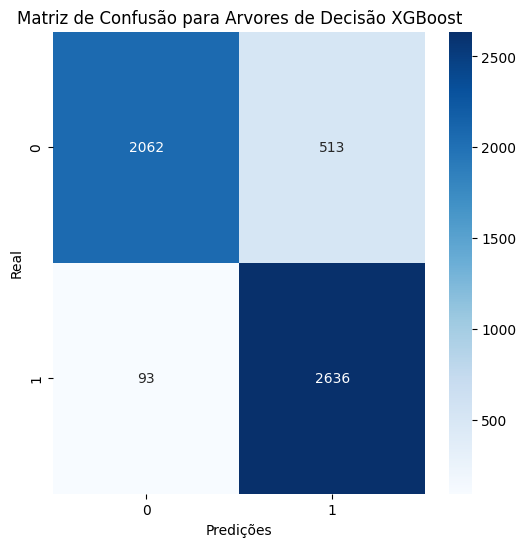

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(tree, 'modelo_tree.pkl')

['modelo_tree.pkl']

In [ ]:
new_sample = np.array([[0.0259441818,  0.0738847787,  0.8204270649, 0.0149293183,  0.0802703167,  0.2060819612]])


#new_sample = scaler.transform(new_sample)


for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Arvores de Decisão XGBoost: Classe 0, Certeza: 50.90%


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8857466063348416


In [ ]:
#Treinando o 5° modelo - Random Forest
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Ajuste o número de árvores conforme necessário
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

In [ ]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
y_pred = rf_model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

acuracia = accuracy_score(y_test, y_pred)
print(f'Acurácia do modelo: {acuracia * 100:.2f}%')

Acurácia do modelo: 89.05%


In [ ]:
print("\nMatriz de Confusão:")
print(confusion_matrix(y_test, y_pred))


Matriz de Confusão:
[[2082  493]
 [  88 2641]]


In [ ]:
print("\nRelatório de Classificação:")
print(classification_report(y_test, y_pred))


Relatório de Classificação:
              precision    recall  f1-score   support

       False       0.96      0.81      0.88      2575
        True       0.84      0.97      0.90      2729

    accuracy                           0.89      5304
   macro avg       0.90      0.89      0.89      5304
weighted avg       0.90      0.89      0.89      5304



In [ ]:
#SEGUNDO CENÁRIO: importanto e treinando as IAs em 90/10 (treino e teste dos dados)

Nasa_Test = pd.read_csv("/content/Dataset_Nasa_Test.csv")

In [ ]:
Nasa_Test.shape

(90836, 10)

In [ ]:
Base_teste = pd.DataFrame(Nasa_Test)

In [ ]:
Base_teste.drop(columns=['id','orbiting_body','sentry_object','name'], inplace=True)

In [ ]:
Base_teste.head()

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,1.198271,2.679415,13569.249224,5.483974e+07,16.73,False
1,0.265800,0.594347,73588.726663,6.143813e+07,20.00,True
2,0.722030,1.614507,114258.692129,4.979872e+07,17.83,False
3,0.096506,0.215794,24764.303138,2.543497e+07,22.20,False
4,0.255009,0.570217,42737.733765,4.627557e+07,20.09,True


In [ ]:
Base_teste.value_counts('hazardous')

,count
hazardous,
False,81996
True,8840


In [ ]:
# Separando as duas classes
dados_false = Base_teste[Base_teste['hazardous'] == False]  # Classe majoritária (False)
dados_true = Base_teste[Base_teste['hazardous'] == True]    # Classe minoritária (True)

# Realizando o undersampling da classe majoritária
dados_false_under = dados_false.sample(n=len(dados_true), random_state=42)  # Subamostra para igualar os True (9000)

#Concatenando a classe minoritária com a subamostra da majoritária
NovaBase_balanceda = pd.concat([dados_false_under, dados_true])

In [ ]:
NovaBase_balanceda.value_counts('hazardous')

,count
hazardous,
False,8840
True,8840


In [ ]:
X = NovaBase_balanceda.drop(columns=['hazardous']) # Select all columns except 'target' for features
y = NovaBase_balanceda['hazardous'] # Select the 'target' column

# Now you can create your DataFrame
dados_testes = pd.DataFrame(X, columns=X.columns) # Use X.columns to get feature names
dados_testes ['hazardous'] = y
dados_testes.sample(10)

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
7364,0.162388,0.363111,110179.126874,4.680552e+07,21.07,True
45113,0.168483,0.376738,68757.822384,4.020705e+07,20.99,True
14028,0.167708,0.375008,90830.883415,7.095827e+07,21.00,False
82378,0.006769,0.015137,30462.494340,1.183814e+06,27.97,False
17514,0.099210,0.221840,6300.973798,6.940170e+07,22.14,False
2219,0.555335,1.241767,55390.955383,6.841415e+07,18.40,False
46984,0.029144,0.065169,57903.558896,1.219170e+07,24.80,False
78988,0.007666,0.017141,82937.340167,6.419531e+07,27.70,False
67085,0.573528,1.282449,39256.585040,5.807842e+07,18.33,True
80764,0.175612,0.392681,51127.139107,3.090129e+07,20.90,True


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=200, batch_size = 10)
mlp.fit(X_train, y_train)

MLPClassifier(batch_size=10, hidden_layer_sizes=(100, 100))

In [ ]:
classifiers = [mlp]
classifier_names = ["Rede Neural"]

Resultados para Rede Neural:
              precision    recall  f1-score   support

       False       0.99      0.76      0.86       899
        True       0.80      0.99      0.89       869

    accuracy                           0.88      1768
   macro avg       0.90      0.88      0.87      1768
weighted avg       0.90      0.88      0.87      1768



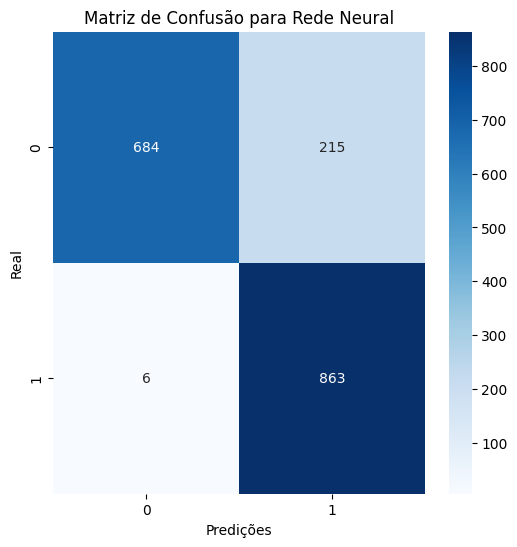

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(mlp, 'modelo_rede_neural.pkl')

['modelo_rede_neural.pkl']

In [ ]:
#Testando uma amostra aleatória
new_sample = np.array([[0.0738847787,0.8204270649, 0.2060819612,
                        0.1010543415,51576.141700413]])
#new_sample = scaler.transform(new_sample)
for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Rede Neural: Classe False, Certeza: 100.00%


In [ ]:
#Testando a IA, pedindo para ela gerar uma amostra qualquer
new_sample_a = X_test[0]
print(new_sample_a)
print(y_test.iloc[0])

[-0.48920997 -0.48920997 -0.40258479 -0.54896417  0.38778565]
False


In [ ]:
#treinando nosso segundo modelo: Árvore de Decisão - DecisionTreeClassifier
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
classifiers = [tree]
classifier_names = ["Árvore de Decisão"]

Resultados para Árvore de Decisão:
              precision    recall  f1-score   support

       False       0.84      0.83      0.83       899
        True       0.82      0.83      0.83       869

    accuracy                           0.83      1768
   macro avg       0.83      0.83      0.83      1768
weighted avg       0.83      0.83      0.83      1768



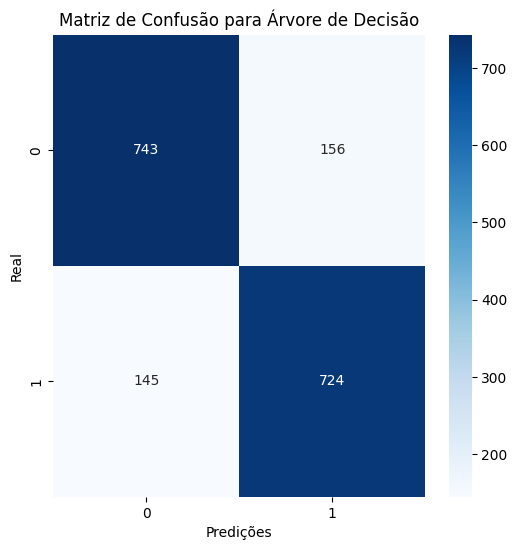

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap= "Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(tree, 'modelo_tree.pkl')

['modelo_tree.pkl']

In [ ]:
new_sample = np.array([[0.0259441818,  0.0738847787,  0.8204270649, 0.0149293183,  0.0802703167,]])


#new_sample = scaler.transform(new_sample)


for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Árvore de Decisão: Classe False, Certeza: 100.00%


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8297511312217195


In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus

feature_cols = [ 'est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude']

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Árvore de Decisão.png')
Image(graph.create_png())

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8744343891402715


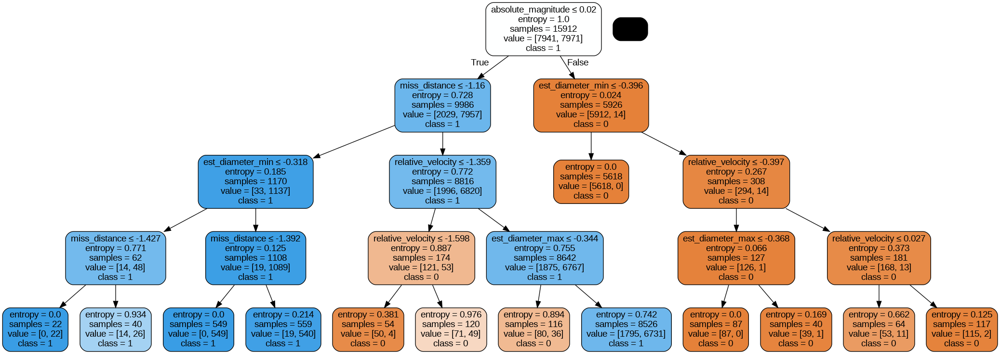

In [ ]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())

In [ ]:
#Treinando nosso terceiro modelo de IA: Keras
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

encoder = OneHotEncoder(sparse_output=False)
# Converta y_train para um array NumPy antes de remodelar
y_train_encoded = encoder.fit_transform(y_train.values.reshape(-1, 1))
y_test_encoded = encoder.transform(y_test.values.reshape(-1, 1))

keras_hidden_layer_sizes = (5, 5)
keras_epochs = 50
keras_batch_size = 1

keras_model = Sequential()
keras_model.add(Dense(5, input_dim=5, activation='sigmoid'))
keras_model.add(Dense(5, activation='sigmoid'))
keras_model.add(Dense(2, activation='softmax'))
keras_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
keras_model.fit(X_train, y_train_encoded, epochs=keras_epochs, batch_size=keras_batch_size, verbose=1)

print(f"Configurações da Rede Neural (Keras):")
print(f"Hidden Layer Sizes: {keras_hidden_layer_sizes}")
print(f"Epochs: {keras_epochs}")
print(f"Batch Size: {keras_batch_size}\n")

#keras_model.save('modelos_keras/modelo_rede_neural.h5')

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15912/15912 ━━━━━━━━━━━━━━━━━━━━ 18s 1ms/step - accuracy: 0.6756 - loss: 0.5953
Epoch 2/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8644 - loss: 0.3476
Epoch 3/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8695 - loss: 0.3274
Epoch 4/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 18s 1ms/step - accuracy: 0.8658 - loss: 0.3291
Epoch 5/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8715 - loss: 0.3175
Epoch 6/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8731 - loss: 0.3162
Epoch 7/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8764 - loss: 0.3128
Epoch 8/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8769 - loss: 0.3096
Epoch 9/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8723 - loss: 0.3147
Epoch 10/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8744 - loss: 0.3130
Epoch 11/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8746 - loss: 0.3090
Epoch 12

In [ ]:
#Treinando nosso 4º modelo: árvores de decisão - XGBoost
xgb = XGBClassifier()  # Para uma tarefa de classificação
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
classifiers = [xgb]
classifier_names = ["Arvores de Decisão XGBoost"]

Resultados para Arvores de Decisão XGBoost:
              precision    recall  f1-score   support

       False       0.97      0.78      0.86       899
        True       0.81      0.97      0.88       869

    accuracy                           0.87      1768
   macro avg       0.89      0.88      0.87      1768
weighted avg       0.89      0.87      0.87      1768



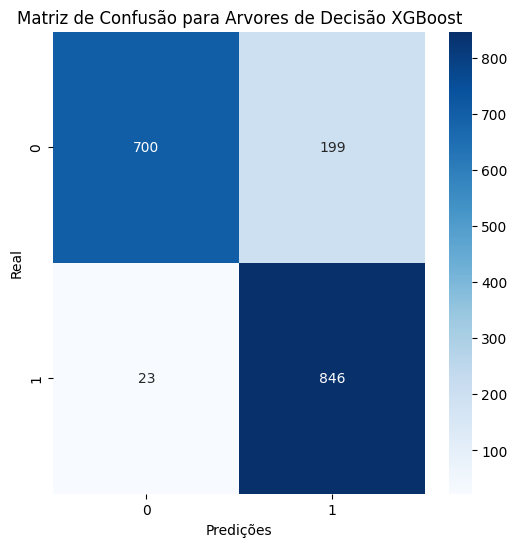

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
#Testando uma amostra aleatória
new_sample = np.array([[0.0738847787,0.8204270649, 0.2060819612,
                        0.1010543415,51576.141700413]])
#new_sample = scaler.transform(new_sample)
for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Arvores de Decisão XGBoost: Classe 1, Certeza: 60.10%


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8744343891402715


In [ ]:
#treinando nosso 5º modelo de IA: Randon Forest
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

In [ ]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
y_pred = rf_model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

acuracia = accuracy_score(y_test, y_pred)
print(f'Acurácia do modelo: {acuracia * 100:.2f}%')

Acurácia do modelo: 87.78%


In [ ]:
print("\nMatriz de Confusão:")
print(confusion_matrix(y_test, y_pred))


Matriz de Confusão:
[[725 174]
 [ 42 827]]


In [ ]:
print("\nRelatório de Classificação:")
print(classification_report(y_test, y_pred))


Relatório de Classificação:
              precision    recall  f1-score   support

       False       0.95      0.81      0.87       899
        True       0.83      0.95      0.88       869

    accuracy                           0.88      1768
   macro avg       0.89      0.88      0.88      1768
weighted avg       0.89      0.88      0.88      1768



In [ ]:
#Importando as bibliotecas para realizar a padronização
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# Usando StandardScaler para padronização
scaler = StandardScaler()

# Aplicando a padronização nas colunas numéricas
dados_scaled = dados.copy()
dados_scaled[['est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude', 'hazardous']] = scaler.fit_transform(dados[['est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude', 'hazardous']])

# Exibindo o DataFrame após a padronização
print(dados_scaled)

       est_diameter_min  est_diameter_max  relative_velocity  miss_distance  \
0              3.587284          3.587284          -1.363913       0.795153   
1              0.463529          0.463529           1.009040       1.090357   
2              1.991887          1.991887           2.616983       0.569624   
3             -0.103601         -0.103601          -0.921301      -0.520384   
4              0.427378          0.427378          -0.210697       0.412001   
...                 ...               ...                ...            ...   
90831         -0.337852         -0.337852           0.158619      -1.108010   
90832         -0.370713         -0.370713          -0.077187       0.771954   
90833         -0.319842         -0.319842          -1.601228      -0.387697   
90834         -0.402370         -0.402370           0.835492       1.414890   
90835         -0.293359         -0.293359          -0.831943       1.015823   

       absolute_magnitude  hazardous  
0           

In [ ]:
# Verificando a média e o desvio padrão das colunas após a padronização
print(dados_scaled.mean())  # A média de todas as variáveis deve ser ~0
print(dados_scaled.std())   # O desvio padrão deve ser ~1


est_diameter_min     -6.070073e-17
est_diameter_max      9.026887e-17
relative_velocity    -1.742017e-16
miss_distance        -1.239046e-16
absolute_magnitude    4.552555e-16
hazardous             4.224020e-18
dtype: float64
est_diameter_min      1.000006
est_diameter_max      1.000006
relative_velocity     1.000006
miss_distance         1.000006
absolute_magnitude    1.000006
hazardous             1.000006
dtype: float64


In [ ]:
# Usando StandardScaler para padronização
scaler = StandardScaler()

# Selecionando apenas colunas numéricas para padronização (excluindo 'hazardous')
colunas_numericas = ['est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude']
dados_scaled = dados.copy()
dados_scaled[colunas_numericas] = scaler.fit_transform(dados[colunas_numericas])

X = dados_scaled.drop(columns=['hazardous']) # Select all columns except 'target' for features
y = dados_scaled['hazardous'] # Select the 'target' column

# Now you can create your DataFrame
dados_scaled = pd.DataFrame(X, columns=X.columns) # Use X.columns to get feature names
dados_scaled['hazardous'] = y
dados_scaled.sample(10)

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
23789,-0.362389,-0.362389,-1.028441,1.255547,0.750810,False
47673,-0.377052,-0.377052,0.209742,-0.901420,0.944309,False
32652,-0.373241,-0.373241,-1.135137,-0.439772,0.889024,False
66960,-0.100610,-0.100610,1.684350,1.406281,-0.465470,False
19453,0.189128,0.189128,0.766648,1.654441,-0.942308,False
21225,0.327497,0.327497,1.364386,1.226845,-1.094343,True
12387,-0.012326,-0.012326,-1.320788,0.694251,-0.645148,False
78856,-0.077274,-0.077274,0.284946,1.060920,-0.517300,True
22251,3.874375,3.874375,1.700392,0.683424,-2.400462,True
36755,-0.380806,-0.380806,-0.358444,-0.533582,1.003050,False


In [ ]:
dados_scaled['hazardous'].value_counts()

,count
hazardous,
False,81996
True,8840


In [ ]:
# Separando as duas classes
dados_false = dados_scaled[dados_scaled['hazardous'] == False]  # Classe majoritária (False)
dados_true = dados_scaled[dados_scaled['hazardous'] == True]    # Classe minoritária (True)

# Realizando o undersampling da classe majoritária
dados_false_under = dados_false.sample(n=len(dados_true), random_state=42)  # Subamostra para igualar os True (9000)

#Concatenando a classe minoritária com a subamostra da majoritária
dados_balancedos = pd.concat([dados_false_under, dados_true])

In [ ]:
dados_balancedos['hazardous'].value_counts()

,count
hazardous,
False,8840
True,8840


In [ ]:
dados_aleatorios = dados_balancedos.sample(frac=1).reset_index(drop=True)

In [ ]:
dados_aleatorios.head(10)

,id,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,2403775,0.164118,0.164118,0.174088,0.688718,-0.911209,True
1,2417217,0.643630,0.643630,0.023945,-0.066498,-1.356949,True
2,2159608,3.757154,3.757154,2.658414,0.007693,-2.379730,False
3,3634186,-0.279121,-0.279121,-1.495000,-0.714125,0.128849,False
4,3699951,-0.132048,-0.132048,-0.520776,1.094607,-0.389453,False
5,3398655,-0.240859,-0.240859,-1.158615,-0.971251,-0.043919,False
6,2475534,0.083137,0.083137,2.464141,1.181000,-0.800638,True
7,3553279,-0.038210,-0.038210,1.678151,1.120751,-0.596773,True
8,2162361,0.407933,0.407933,1.171675,0.319555,-1.170360,True
9,2405212,1.768925,1.768925,0.013156,1.273964,-1.895982,True


In [ ]:
dados_aleatorios['hazardous'].value_counts()

,count
hazardous,
True,8840
False,8840


In [ ]:
#Criando uma amostra estratificada de 10000 linhas da classe

amostra_classe = pd.DataFrame(dados_aleatorios)

grouped = amostra_classe.groupby('hazardous')

sample_true = grouped.get_group(True).sample(n=5000)
sample_false = grouped.get_group(False).sample(n=5000)

sample_balanced = pd.concat([sample_true, sample_false])

nova_amostra = sample_balanced.sample(frac=1)

amostra_estratificada = pd.DataFrame(nova_amostra)

In [ ]:
amostra_estratificada['hazardous'].value_counts()

,count
hazardous,
True,5000
False,5000


In [ ]:
X = amostra_estratificada.drop(columns=['hazardous']) # Select all columns except 'target' for features
y = amostra_estratificada['hazardous'] # Select the 'target' column

# Now you can create your DataFrame
dados_mixed = pd.DataFrame(X, columns=X.columns) # Use X.columns to get feature names
dados_mixed['hazardous'] = y
dados_mixed.sample(10)

,id,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
10310,3799281,-0.309514,-0.309514,0.572298,1.050103,0.301616,False
4314,54051175,-0.341860,-0.341860,1.205151,1.048548,0.543490,False
14646,3788123,-0.298189,-0.298189,0.090390,-1.275925,0.232509,False
6104,3776300,0.085491,0.085491,-0.856784,-1.058345,-0.804094,True
8506,3408243,-0.394565,-0.394565,-1.129332,0.118459,1.269111,False
3678,2376879,-0.077274,-0.077274,-0.252031,1.232710,-0.517300,False
17632,3553283,0.161403,0.161403,0.602089,-0.597844,-0.907754,True
11635,3825097,0.463529,0.463529,1.117073,0.856149,-1.218735,True
1220,2277475,0.463529,0.463529,-0.960271,0.215198,-1.218735,True
6776,54110699,-0.144018,-0.144018,-0.036978,0.680569,-0.358355,False


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
#TERCEIRO CENÁRIO: Base menor estratificada com 10000 dados, balanceada e escalonada:
#Treinando nosso primeiro modelo: Rede Neural - MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=200, batch_size = 10)
mlp.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(batch_size=10, hidden_layer_sizes=(100, 100))

In [ ]:
classifiers = [mlp]
classifier_names = ["Rede Neural"]

Resultados para Rede Neural:
              precision    recall  f1-score   support

       False       0.96      0.79      0.87      1476
        True       0.83      0.97      0.89      1524

    accuracy                           0.88      3000
   macro avg       0.90      0.88      0.88      3000
weighted avg       0.89      0.88      0.88      3000



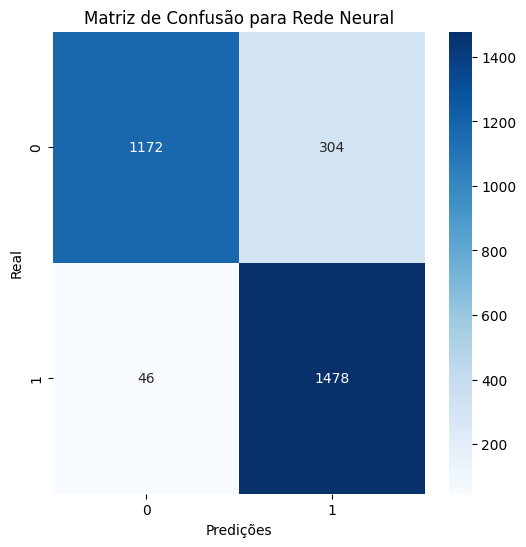

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(mlp, 'modelo_rede_neural.pkl')

['modelo_rede_neural.pkl']

In [ ]:
#Testando uma amostra aleatória
new_sample = np.array([[0.0738847787,0.8204270649, 0.2060819612,
                        0.1010543415,51576.141700413,0.3750075218]])
#new_sample = scaler.transform(new_sample)
for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Rede Neural: Classe False, Certeza: 100.00%


In [ ]:
#treinando nosso segundo modelo: Árvore de Decisão - DecisionTreeClassifier
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
classifiers = [tree]
classifier_names = ["Árvore de Decisão"]

Resultados para Árvore de Decisão:
              precision    recall  f1-score   support

       False       0.82      0.86      0.84      1476
        True       0.85      0.82      0.84      1524

    accuracy                           0.84      3000
   macro avg       0.84      0.84      0.84      3000
weighted avg       0.84      0.84      0.84      3000



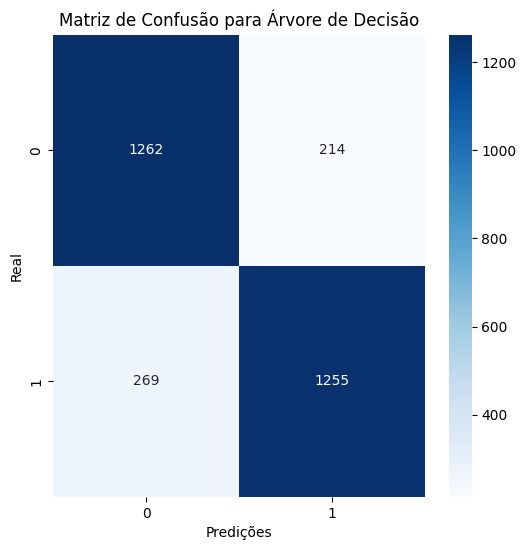

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap= "Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(tree, 'modelo_tree.pkl')

['modelo_tree.pkl']

In [ ]:
new_sample = np.array([[0.0259441818,  0.0738847787,  0.8204270649, 0.0149293183,  0.0802703167,  0.2060819612]])

#new_sample = scaler.transform(new_sample)

for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Árvore de Decisão: Classe False, Certeza: 100.00%


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.839


In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus

feature_cols = ['id', 'est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude']

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Árvore de Decisão.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.86922 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.86922 to fit



In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8873333333333333


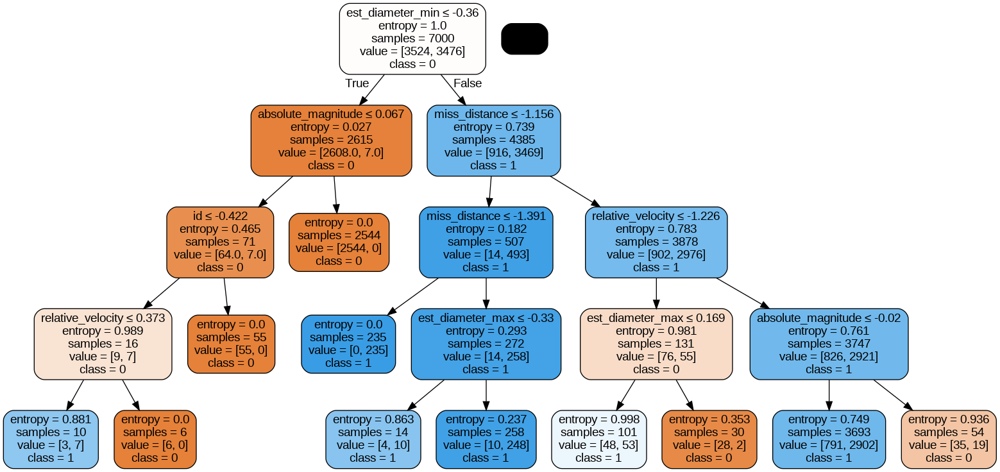

In [ ]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())

In [ ]:
#Treinando o 3° modelo - Random Forest com a amostra estratificada
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Ajuste o número de árvores conforme necessário
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

In [ ]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
y_pred = rf_model.predict(X_test)

In [ ]:
classifiers = [rf_model]
classifier_names = ["Árvore Randômica"]

In [ ]:
from sklearn.metrics import accuracy_score

acuracia = accuracy_score(y_test, y_pred)
print(f'Acurácia do modelo: {acuracia * 100:.2f}%')

Acurácia do modelo: 89.10%


In [ ]:
print("\nMatriz de Confusão:")
print(confusion_matrix(y_test, y_pred))


Matriz de Confusão:
[[1207  269]
 [  58 1466]]


In [ ]:
print("\nRelatório de Classificação:")
print(classification_report(y_test, y_pred))


Relatório de Classificação:
              precision    recall  f1-score   support

       False       0.95      0.82      0.88      1476
        True       0.84      0.96      0.90      1524

    accuracy                           0.89      3000
   macro avg       0.90      0.89      0.89      3000
weighted avg       0.90      0.89      0.89      3000



In [ ]:
joblib.dump(rf_model, 'modelo_Árvore Randômica.pkl')

['modelo_Árvore Randômica.pkl']

In [ ]:
#Treinando nosso 4º modelo: árvores de decisão - XGBoost
xgb = XGBClassifier()  # Para uma tarefa de classificação
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
classifiers = [xgb]
classifier_names = ["Arvores de Decisão XGBoost"]

Resultados para Arvores de Decisão XGBoost:
              precision    recall  f1-score   support

       False       0.94      0.83      0.88      1476
        True       0.85      0.95      0.89      1524

    accuracy                           0.89      3000
   macro avg       0.89      0.89      0.89      3000
weighted avg       0.89      0.89      0.89      3000



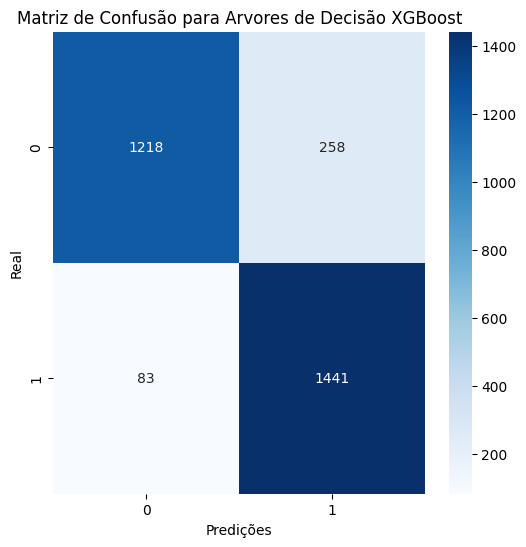

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
new_sample = np.array([[0.0259441818,  0.0738847787,  0.8204270649, 0.0149293183,  0.0802703167,  0.2060819612]])

#new_sample = scaler.transform(new_sample)

for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Arvores de Decisão XGBoost: Classe 0, Certeza: 53.63%


In [ ]:
#Treinando nosso terceiro modelo de IA: Keras
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

encoder = OneHotEncoder(sparse_output=False)
# Converta y_train para um array NumPy antes de remodelar
y_train_encoded = encoder.fit_transform(y_train.values.reshape(-1, 1))
y_test_encoded = encoder.transform(y_test.values.reshape(-1, 1))

keras_hidden_layer_sizes = (6, 6)
keras_epochs = 50
keras_batch_size = 1

keras_model = Sequential()
keras_model.add(Dense(6, input_dim=6, activation='sigmoid'))
keras_model.add(Dense(6, activation='sigmoid'))
keras_model.add(Dense(2, activation='softmax'))
keras_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
keras_model.fit(X_train, y_train_encoded, epochs=keras_epochs, batch_size=keras_batch_size, verbose=1)

print(f"Configurações da Rede Neural (Keras):")
print(f"Hidden Layer Sizes: {keras_hidden_layer_sizes}")
print(f"Epochs: {keras_epochs}")
print(f"Batch Size: {keras_batch_size}\n")

#keras_model.save('modelos_keras/modelo_rede_neural.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - accuracy: 0.6962 - loss: 0.6052
Epoch 2/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - accuracy: 0.8413 - loss: 0.3949
Epoch 3/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step - accuracy: 0.8578 - loss: 0.3537
Epoch 4/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step - accuracy: 0.8626 - loss: 0.3445
Epoch 5/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - accuracy: 0.8724 - loss: 0.3238
Epoch 6/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step - accuracy: 0.8598 - loss: 0.3416
Epoch 7/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - accuracy: 0.8660 - loss: 0.3305
Epoch 8/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step - accuracy: 0.8708 - loss: 0.3226
Epoch 9/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step - accuracy: 0.8629 - loss: 0.3278
Epoch 10/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - accuracy: 0.8681 - loss: 0.3243
Epoch 11/50
7000/7000 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - accuracy: 0.8719 - loss: 0.3180
Epoch 12/50
7000/7000 ━━━━━━━━

In [ ]:
#QUARTO CENÁRIO: Analise com a Base balanceada e escalonada em 70/30.
dados_aleatorios['hazardous'].value_counts()

,count
hazardous,
True,8840
False,8840


In [ ]:
X = dados_aleatorios.drop(columns=['hazardous']) # Select all columns except 'target' for features
y = dados_aleatorios['hazardous'] # Select the 'target' column

# Now you can create your DataFrame
dados_aleatorios = pd.DataFrame(X, columns=X.columns) # Use X.columns to get feature names
dados_aleatorios['hazardous'] = y
dados_aleatorios.sample(10)

,id,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
9301,2265196,1.142011,1.142011,-0.164857,0.035868,-1.643742,True
6505,2488803,0.280394,0.280394,-0.663416,0.703305,-1.045968,False
11748,2380636,0.576789,0.576789,-0.377093,0.703311,-1.308574,True
12779,3838020,0.280394,0.280394,-0.106210,1.175964,-1.045968,True
12908,2162116,0.860159,0.860159,0.220718,-0.629929,-1.495162,True
5691,2512244,1.991887,1.991887,3.050442,1.232624,-1.968544,False
14553,54017087,-0.409372,-0.409372,0.588504,0.865111,1.728672,False
7348,54105510,-0.102109,-0.102109,1.511930,0.367385,-0.462015,False
4187,2525484,0.066957,0.066957,-0.576551,0.571777,-0.776451,True
9286,2192563,2.747031,2.747031,-0.022740,1.117336,-2.172409,True


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
#treinando nosso 1º modelo: Rede Neural - MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=200, batch_size = 10)
mlp.fit(X_train, y_train)

MLPClassifier(batch_size=10, hidden_layer_sizes=(100, 100))

In [ ]:
classifiers1 = [mlp]
classifier_names1 = ["Rede Neural"]

Resultados para Rede Neural:
              precision    recall  f1-score   support

       False       0.96      0.78      0.86      2575
        True       0.83      0.97      0.89      2729

    accuracy                           0.88      5304
   macro avg       0.89      0.88      0.88      5304
weighted avg       0.89      0.88      0.88      5304



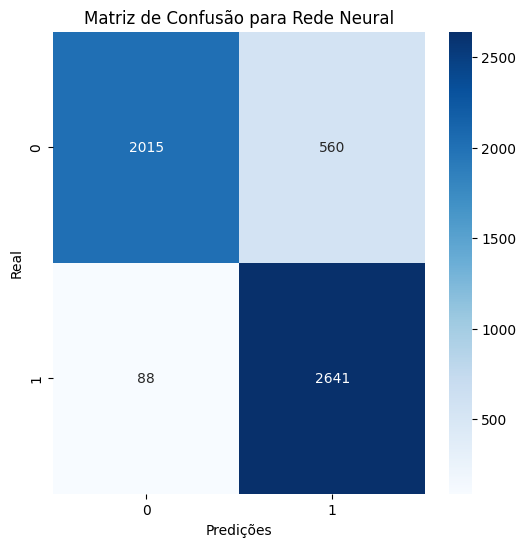

In [ ]:
for clf, clf_name in zip(classifiers1, classifier_names1):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(mlp, 'modelo_rede_neural.pkl')

['modelo_rede_neural.pkl']

In [ ]:
#treinando nosso 2º modelo: Árvore de Decisão - DecisionTreeClassifier
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
classifiers1 = [tree]
classifier_names1 = ["Árvore de Decisão"]

Resultados para Árvore de Decisão:
              precision    recall  f1-score   support

       False       0.84      0.83      0.83       899
        True       0.82      0.83      0.83       869

    accuracy                           0.83      1768
   macro avg       0.83      0.83      0.83      1768
weighted avg       0.83      0.83      0.83      1768



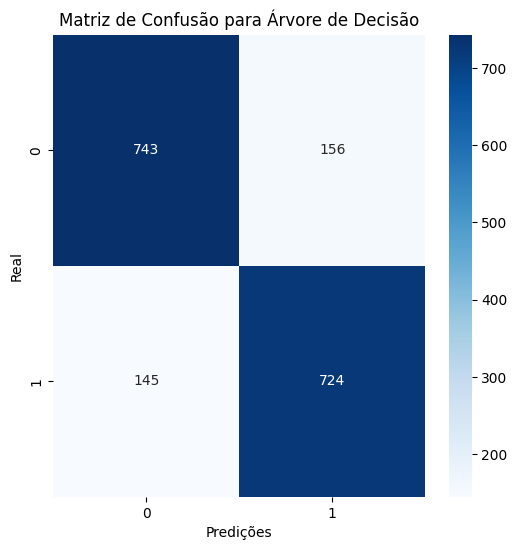

In [ ]:
for clf, clf_name in zip(classifiers1, classifier_names1):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap= "Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
joblib.dump(tree, 'modelo_tree.pkl')

['modelo_tree.pkl']

In [ ]:
new_sample = np.array([[0.0259441818,  0.0738847787,  0.8204270649, 0.0149293183,  0.0802703167,]])

#new_sample = scaler.transform(new_sample)

for clf, clf_name in zip(classifiers1, classifier_names1):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Árvore de Decisão: Classe False, Certeza: 100.00%


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8582202111613876


In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus

feature_cols = ['est_diameter_min', 'est_diameter_max', 'relative_velocity', 'miss_distance', 'absolute_magnitude']

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['1','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Árvore de Decisão.png')
Image(graph.create_png())

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8744343891402715


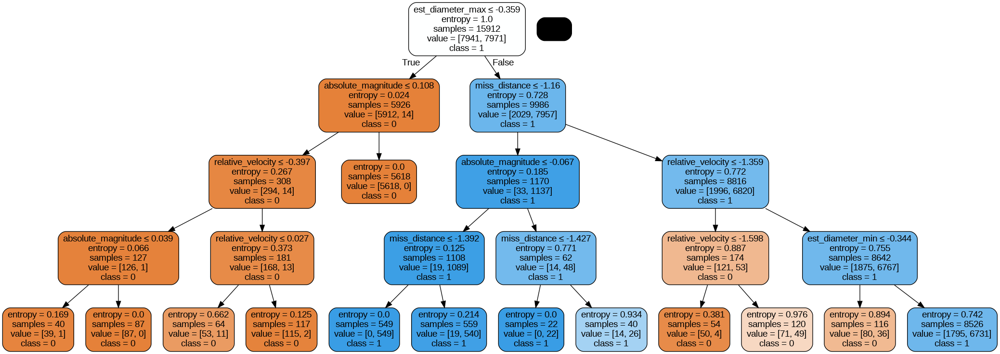

In [ ]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('periculosidade.png')
Image(graph.create_png())

In [ ]:
#Treinando o 3° modelo - Random Forest
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Ajuste o número de árvores conforme necessário
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

In [ ]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
y_pred = rf_model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

acuracia = accuracy_score(y_test, y_pred)
print(f'Acurácia do modelo: {acuracia * 100:.2f}%')

Acurácia do modelo: 87.78%


In [ ]:
print("\nMatriz de Confusão:")
print(confusion_matrix(y_test, y_pred))


Matriz de Confusão:
[[725 174]
 [ 42 827]]


In [ ]:
print("\nRelatório de Classificação:")
print(classification_report(y_test, y_pred))


Relatório de Classificação:
              precision    recall  f1-score   support

       False       0.95      0.81      0.87       899
        True       0.83      0.95      0.88       869

    accuracy                           0.88      1768
   macro avg       0.89      0.88      0.88      1768
weighted avg       0.89      0.88      0.88      1768



In [ ]:
#Treinando nosso 4º modelo: árvores de decisão - XGBoost
xgb = XGBClassifier()  # Para uma tarefa de classificação
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
classifiers = [xgb]
classifier_names = ["Arvores de Decisão XGBoost"]

Resultados para Arvores de Decisão XGBoost:
              precision    recall  f1-score   support

       False       0.97      0.78      0.86       899
        True       0.81      0.97      0.88       869

    accuracy                           0.87      1768
   macro avg       0.89      0.88      0.87      1768
weighted avg       0.89      0.87      0.87      1768



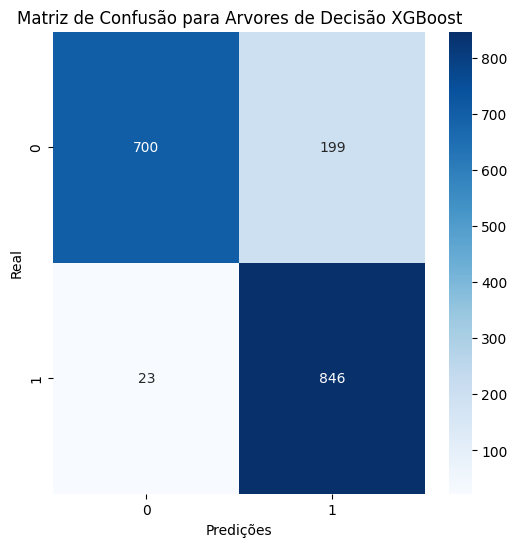

In [ ]:
for clf, clf_name in zip(classifiers, classifier_names):
    y_pred = clf.predict(X_test)
    print(f"Resultados para {clf_name}:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot = True, fmt="d", cmap="Blues");
    plt.xlabel('Predições')
    plt.ylabel('Real')
    plt.title(f"Matriz de Confusão para {clf_name}")
    plt.show()

In [ ]:
new_sample = np.array([[0.0259441818,  0.8204270649, 0.0149293183,  0.0802703167,  0.2060819612]])

#new_sample = scaler.transform(new_sample)

for clf, clf_name in zip(classifiers, classifier_names):
    prediction = clf.predict(new_sample)
    probability = clf.predict_proba(new_sample).max()
    print(f"Previsão para {clf_name}: Classe {prediction[0]}, Certeza: {probability * 100:.2f}%")

Previsão para Arvores de Decisão XGBoost: Classe 1, Certeza: 55.79%


In [ ]:
#Treinando nosso 5º modelo de IA: Keras
from sklearn.preprocessing import OneHotEncoder
import pandas as pd
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense


encoder = OneHotEncoder(sparse_output=False)
# Converta y_train para um array NumPy antes de remodelar
y_train_encoded = encoder.fit_transform(y_train.values.reshape(-1, 1))
y_test_encoded = encoder.transform(y_test.values.reshape(-1, 1))

keras_hidden_layer_sizes = (5, 5)
keras_epochs = 50
keras_batch_size = 1

# The error was here.  X_train has 5 features, not 6.
# Change input_dim to 5 to match the number of features in X_train
keras_model = Sequential()
keras_model.add(Dense(5, input_dim=5, activation='sigmoid')) # Changed input_dim to 5
keras_model.add(Dense(5, activation='sigmoid'))
keras_model.add(Dense(2, activation='softmax'))
keras_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
keras_model.fit(X_train, y_train_encoded, epochs=keras_epochs, batch_size=keras_batch_size, verbose=1)

print(f"Configurações da Rede Neural (Keras):")
print(f"Hidden Layer Sizes: {keras_hidden_layer_sizes}")
print(f"Epochs: {keras_epochs}")
print(f"Batch Size: {keras_batch_size}\n")

#keras_model.save('modelos_keras/modelo_rede_neural.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 33s 2ms/step - accuracy: 0.6677 - loss: 0.5943
Epoch 2/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 24s 2ms/step - accuracy: 0.8598 - loss: 0.3559
Epoch 3/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 33s 1ms/step - accuracy: 0.8652 - loss: 0.3404
Epoch 4/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 21s 1ms/step - accuracy: 0.8694 - loss: 0.3257
Epoch 5/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 21s 1ms/step - accuracy: 0.8682 - loss: 0.3263
Epoch 6/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 20s 1ms/step - accuracy: 0.8738 - loss: 0.3161
Epoch 7/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 21s 1ms/step - accuracy: 0.8714 - loss: 0.3203
Epoch 8/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - accuracy: 0.8722 - loss: 0.3168
Epoch 9/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 21s 1ms/step - accuracy: 0.8716 - loss: 0.3181
Epoch 10/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 20s 1ms/step - accuracy: 0.8744 - loss: 0.3143
Epoch 11/50
15912/15912 ━━━━━━━━━━━━━━━━━━━━ 22s 1ms/step - accuracy: 0.8690 - loss: 0.31